In [1]:
! pwd

/content


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Imports

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import datetime
import operator
import os
from random import sample
import shutil
import itertools

import sklearn
assert sklearn.__version__ >= "0.20"
from sklearn.metrics import confusion_matrix
from sklearn import metrics
#from sklearn.dummy import DummyClassifier

from functools import partial
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"
from tensorflow.keras.callbacks import TensorBoard 
from tensorflow.keras.preprocessing.image import ImageDataGenerator 


Definitions and Classes

In [4]:
def img_gen_train(train_dir,validation_dir,test_dir,target_size=(32,32),color_mode='rgba',class_mode='categorical',batch_size=32):

    train_datagen = ImageDataGenerator(
                        #rescale=1./255,
                        #shear_range=0.2,
                        #zoom_range=0.2,
                        #horizontal_flip=True
                        )

    validation_datagen = ImageDataGenerator(
                        #rescale=1./255
                        )

    train_generator = train_datagen.flow_from_directory(
                                    train_dir,
                                    target_size=target_size,
                                    color_mode=color_mode,
                                    batch_size=batch_size,
                                    class_mode=class_mode,
                                    interpolation='nearest')#might try bilinear

    validation_generator = validation_datagen.flow_from_directory(
                                    validation_dir,
                                    target_size=target_size,
                                    color_mode=color_mode,
                                    batch_size=batch_size,
                                    class_mode=class_mode,
                                    interpolation='nearest')#might try bilinear

    test_generator = validation_datagen.flow_from_directory(
                                    test_dir,
                                    target_size=target_size,
                                    color_mode=color_mode,
                                    batch_size=batch_size,
                                    class_mode=class_mode,
                                    interpolation='nearest')#might try bilinear                                           

    return train_generator,validation_generator,test_generator

In [5]:
def build_baseline_model(n_features,input_shape=[32,32,4]):
    '''
    Builds a super basic model for establishing a baseline and making sure all the preprocessing is working smoothly. Only has 2 conv layers with pooling. Based on https://github.com/ageron/handson-ml2/blob/master/14_deep_computer_vision_with_cnns.ipynb

    Inputs:
    n_features: number of catagories from training set
    input_shape = shape of images in dataset [width,height,number of channels]

    Output:
    model: baseline model ready for training
    '''
    model = keras.models.Sequential([
        keras.layers.Conv2D(filters=64, kernel_size=7, input_shape=input_shape,activation='relu'),
        keras.layers.MaxPooling2D(pool_size=2),
        keras.layers.Conv2D(filters=64, kernel_size=7, input_shape=input_shape,activation='relu'),
        keras.layers.MaxPooling2D(pool_size=2),
        keras.layers.Flatten(),
        keras.layers.Dense(units=128, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(units=64, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(units=n_features, activation='softmax')
    ])
    return model

In [6]:
def build_sequential_model(n_features,input_shape=[32,32,4]):
    model = keras.models.Sequential([
        keras.layers.Conv2D(filters=64, kernel_size=3, input_shape=input_shape,activation='relu'),
        keras.layers.MaxPooling2D(pool_size=2),
        keras.layers.Conv2D(filters=64, kernel_size=3, input_shape=input_shape,activation='relu'),
        keras.layers.MaxPooling2D(pool_size=2),
        keras.layers.Conv2D(filters=64, kernel_size=3, input_shape=input_shape,activation='relu'),
        keras.layers.MaxPooling2D(pool_size=2),
        keras.layers.Flatten(),
        keras.layers.Dense(units=128, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(units=64, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(units=n_features, activation='softmax')
    ])   
    return model

In [7]:
DefaultConv2D = partial(keras.layers.Conv2D, kernel_size=3, strides=1,
                        padding="SAME", use_bias=False)

In [8]:
class ResidualUnit(keras.layers.Layer):
    def __init__(self, filters, strides=1, activation="relu", **kwargs):
        super().__init__(**kwargs)
        self.activation = keras.activations.get(activation)
        self.main_layers = [
            DefaultConv2D(filters, strides=strides),
            keras.layers.BatchNormalization(),
            self.activation,
            DefaultConv2D(filters),
            keras.layers.BatchNormalization()]
        self.skip_layers = []
        if strides > 1:
            self.skip_layers = [
                DefaultConv2D(filters, kernel_size=1, strides=strides),
                keras.layers.BatchNormalization()]

    def call(self, inputs):
        Z = inputs
        for layer in self.main_layers:
            Z = layer(Z)
        skip_Z = inputs
        for layer in self.skip_layers:
            skip_Z = layer(skip_Z)
        return self.activation(Z + skip_Z)

In [9]:
def build_resnet(n_features=10,input_shape=[32,32,4]):
    model = keras.models.Sequential()
    model.add(DefaultConv2D(64, kernel_size=7, strides=2,
                            input_shape=input_shape))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))
    model.add(keras.layers.MaxPool2D(pool_size=3, strides=2, padding="SAME"))
    prev_filters = 64
    for filters in [64] * 3 + [128] * 4 + [256] * 6 + [512] * 3:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters
    model.add(keras.layers.GlobalAvgPool2D())
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(n_features, activation="softmax"))
    return model

In [10]:
def model_compile_fit(model,train_generator,validation_generator,test_generator,callbacks,metrics=['accuracy'],n_epoch_steps=2000,n_epochs=50,validation_steps=800):

    '''Fits a given model and returns some typical stuff'''

    model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=metrics)

    history = model.fit(train_generator,
                        steps_per_epoch=n_epoch_steps,
                        epochs=n_epochs,
                        validation_data=validation_generator,validation_steps=validation_steps,
                        callbacks=callbacks,
                        verbose=1)
    
    predictions = model.predict(test_generator)

    return history,predictions

In [11]:
def image_plot(rows,batch,predictions,features,save=False,save_dir='',cols=32,figsize=(4,4)):  
    """ 
    Plots images with thier predicted class and actual class
    Used after model has been fit to see results of test data
    
    Parameters: 
        rows (int): number of rows for the images displayed
        batch (ImageDataGenerator): test batch of pictures that will be predicted in model
        model : the model training images have been trained on to be used to predict test images
        cols (int) : number of columns displayed ( set to batch size )
        features (list): list of features to show
    
    Returns: 
        plot: Plot of images with their predicted class and their actual class
    """
    fig, axs = plt.subplots(rows,cols,figsize=(cols * figsize[0],rows * figsize[1]))

    for i in range(rows):
        images, labels = next(batch)
        for j, pic in enumerate(images):
            title = 'Predicted:' + ' ' + features[list(predictions[j]).index(predictions[j].max())] + ' ' + '\n' + 'Actual:' + ' ' + features[list(labels[j]).index(1)] + '\n' + 'Confidence:' + str(predictions[j].max().round(2))
            if rows > 1:
                axs[i,j].imshow(pic.astype('uint8'))
                axs[i,j].set_title(title,color='blue')
                axs[i,j].axis('off')
                if features[list(predictions[j]).index(predictions[j].max())] != features[list(labels[j]).index(1)]:
                  axs[i,j].set_title(title,color='red')
            else:
                axs[j].imshow(pic.astype('uint8'))
                axs[j].set_title(title,color='blue')
                if features[list(predictions[j]).index(predictions[j].max())] != features[list(labels[j]).index(1)]:
                  axs[j].set_title(title,color='red')
                axs[j].axis('off')


    plt.tight_layout()
    plt.show()

    if save == True:
      plt.savefig(save_dir,dpi=150,transparent=True)

In [12]:
def build_cnf_matrix(predictions,generator):
  '''
  Returns a CMF matrix from predicted and actual labels for a prediction imnage set
  '''

  y_pred = np.argmax(predictions, axis=1)

  y_actual_lst = [(np.argmax(generator[i][1], axis = 1)) for i in range(len(generator.labels)//generator.batch_size + 1)]
  y_actual_arr = np.append(np.stack(y_actual_lst[:-1]).flatten(),y_actual_lst[-1])

  return np.round(confusion_matrix(y_actual_arr, y_pred),2)

In [13]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues,
                          figsize=(10,10)):
  """
  This function prints and plots the confusion matrix.
  Normalization can be applied by setting `normalize=True`.
  """
  fig, ax = plt.subplots(figsize=figsize)

  if normalize:
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
      cm = cm * 100
      print("\nNormalized confusion matrix")
  else:
      print('\nConfusion matrix, without normalization')
  print(cm)
  print ()

  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=90)
  plt.yticks(tick_marks, classes)

  fmt = '.0f' if normalize else 'd'
  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, format(cm[i, j], fmt),
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")

  plt.tight_layout()
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

if __name__ == '__main__':

Set directories

In [14]:
! ls 

drive  sample_data


In [15]:
train_dir = 'drive/MyDrive/capstone-2/data/textures/train'
validation_dir = 'drive/MyDrive/capstone-2/data/textures/val'
test_dir = 'drive/MyDrive/capstone-2/data/textures/holdout'

checkpoints_dir = 'drive/MyDrive/capstone-2/callbacks/checkpoints'
logs_dir = 'drive/MyDrive/capstone-2/callbacks/logs/'

baseline_checkpoint_dir = 'drive/MyDrive/capstone-2/callbacks/checkpoints/baseline'
baseline_log_dir = 'drive/MyDrive/capstone-2/callbacks/logs/baseline'
seq_checkpoint_dir = 'drive/MyDrive/capstone-2/callbacks/checkpoints/seq'
seq_log_dir = 'drive/MyDrive/capstone-2/callbacks/logs/seq'
resnet_checkpoint_dir = 'drive/MyDrive/capstone-2/callbacks/checkpoints/resnet'
resnet_log_dir = 'drive/MyDrive/capstone-2/callbacks/logs/resnet'

Features variables

In [16]:
list_features = ['background','bricks_masonry','characters','cutscene','design_patterns','earth_rocks_terrain','fx','metal','natural_patterns','object','portraits','sprite_menu','text','water','wood']
n_features = len(list_features)
img_res = 32

Callbacks

In [17]:
baseline_cb_early_stop = tf.keras.callbacks.EarlyStopping(monitor='loss',
                                                patience=5,
                                                verbose=1)

baseline_cb_tb_logs = tf.keras.callbacks.TensorBoard(log_dir=baseline_log_dir,histogram_freq=1)

baseline_cb_model_cp = tf.keras.callbacks.ModelCheckpoint(
                                                monitor='val_accuracy',
                                                filepath=baseline_checkpoint_dir,
                                                save_weights_only=True,
                                                save_best_only=True,
                                                save_freq='epoch',
                                                verbose=1)

baseline_callbacks = [baseline_cb_early_stop,baseline_cb_tb_logs,baseline_cb_model_cp]

In [18]:
seq_cb_early_stop = tf.keras.callbacks.EarlyStopping(monitor='loss',
                                            patience=5,
                                            verbose=1)

seq_cb_tb_logs = tf.keras.callbacks.TensorBoard(log_dir=seq_log_dir,histogram_freq=1)

seq_cb_model_cp = tf.keras.callbacks.ModelCheckpoint(
                                                monitor='val_accuracy',
                                                filepath=seq_checkpoint_dir,
                                                save_weights_only=True,
                                                save_best_only=True,
                                                save_freq='epoch',
                                                verbose=1)

seq_callbacks = [seq_cb_early_stop,seq_cb_tb_logs,seq_cb_model_cp]

In [19]:
resnet_cb_early_stop = tf.keras.callbacks.EarlyStopping(monitor='loss',
                                            patience=5,
                                            verbose=1)

resnet_cb_tb_logs = tf.keras.callbacks.TensorBoard(log_dir=resnet_log_dir,histogram_freq=1)

resnet_cb_model_cp = tf.keras.callbacks.ModelCheckpoint(
                                                monitor='val_accuracy',
                                                filepath=resnet_checkpoint_dir,
                                                save_weights_only=True,
                                                save_best_only=True,
                                                save_freq='epoch',
                                                verbose=1)

resnet_callbacks = [resnet_cb_early_stop,resnet_cb_tb_logs,resnet_cb_model_cp]

Generate imagesets

In [20]:
train_generator,validation_generator,test_generator = img_gen_train(train_dir,validation_dir,test_dir,target_size=(img_res,img_res),color_mode='rgba')

Found 3399 images belonging to 15 classes.
Found 592 images belonging to 15 classes.
Found 699 images belonging to 15 classes.


In [21]:
baseline_model = build_baseline_model(n_features,input_shape=[img_res,img_res,4])
baseline_model.summary()



Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 64)        12608     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 7, 7, 64)          200768    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 3, 3, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 576)               0         
_________________________________________________________________
dense (Dense)                (None, 128)               73856     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0

In [137]:
baseline_history = model_compile_fit(baseline_model,train_generator,validation_generator,test_generator,baseline_callbacks,n_epoch_steps=80,n_epochs=10,validation_steps=10)

Epoch 1/10
80/80 [==============================] - 6s 63ms/step - loss: 7.9341 - accuracy: 0.1266 - val_loss: 2.6518 - val_accuracy: 0.1688

Epoch 00001: val_accuracy improved from -inf to 0.16875, saving model to drive/MyDrive/capstone-2/callbacks/checkpoints/baseline
Epoch 2/10
80/80 [==============================] - 4s 48ms/step - loss: 2.6414 - accuracy: 0.1527 - val_loss: 2.5932 - val_accuracy: 0.1813

Epoch 00002: val_accuracy improved from 0.16875 to 0.18125, saving model to drive/MyDrive/capstone-2/callbacks/checkpoints/baseline
Epoch 3/10
80/80 [==============================] - 4s 47ms/step - loss: 2.5890 - accuracy: 0.1645 - val_loss: 2.5399 - val_accuracy: 0.1844

Epoch 00003: val_accuracy improved from 0.18125 to 0.18438, saving model to drive/MyDrive/capstone-2/callbacks/checkpoints/baseline
Epoch 4/10
80/80 [==============================] - 4s 47ms/step - loss: 2.5684 - accuracy: 0.1558 - val_loss: 2.5199 - val_accuracy: 0.1813

Epoch 00004: val_accuracy did not impro

Sequential model with more layers than baseline

In [22]:
seq_model = build_sequential_model(n_features,input_shape=[img_res,img_res,4])
seq_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 30, 30, 64)        2368      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 15, 15, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 13, 13, 64)        36928     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 4, 4, 64)          36928     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 2, 2, 64)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 256)              

In [138]:
seq_history = model_compile_fit(seq_model,train_generator,validation_generator,test_generator,seq_callbacks,n_epoch_steps=80,n_epochs=10,validation_steps=10)

Epoch 1/10
80/80 [==============================] - 6s 64ms/step - loss: 5.4672 - accuracy: 0.1294 - val_loss: 2.6712 - val_accuracy: 0.1531

Epoch 00001: val_accuracy improved from -inf to 0.15313, saving model to drive/MyDrive/capstone-2/callbacks/checkpoints/seq
Epoch 2/10
80/80 [==============================] - 4s 47ms/step - loss: 2.6696 - accuracy: 0.1602 - val_loss: 2.6335 - val_accuracy: 0.1781

Epoch 00002: val_accuracy improved from 0.15313 to 0.17812, saving model to drive/MyDrive/capstone-2/callbacks/checkpoints/seq
Epoch 3/10
80/80 [==============================] - 4s 50ms/step - loss: 2.6191 - accuracy: 0.1711 - val_loss: 2.6015 - val_accuracy: 0.1719

Epoch 00003: val_accuracy did not improve from 0.17812
Epoch 4/10
80/80 [==============================] - 4s 48ms/step - loss: 2.5861 - accuracy: 0.1633 - val_loss: 2.5400 - val_accuracy: 0.1594

Epoch 00004: val_accuracy did not improve from 0.17812
Epoch 5/10
80/80 [==============================] - 4s 47ms/step - loss

Resnet Model

In [23]:
resnet_model = build_resnet(n_features,input_shape=[img_res,img_res,4])
resnet_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 16, 16, 64)        12544     
_________________________________________________________________
batch_normalization (BatchNo (None, 16, 16, 64)        256       
_________________________________________________________________
activation (Activation)      (None, 16, 16, 64)        0         
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
residual_unit (ResidualUnit) (None, 8, 8, 64)          74240     
_________________________________________________________________
residual_unit_1 (ResidualUni (None, 8, 8, 64)          74240     
_________________________________________________________________
residual_unit_2 (ResidualUni (None, 8, 8, 64)         

In [24]:
resnet_history,resnet_predictions = model_compile_fit(resnet_model,train_generator,validation_generator,test_generator,resnet_callbacks,n_epoch_steps=80,n_epochs=10,validation_steps=10)


Epoch 1/10
80/80 [==============================] - 879s 11s/step - loss: 2.5314 - accuracy: 0.2531 - val_loss: 76.0486 - val_accuracy: 0.0875

Epoch 00001: val_accuracy improved from -inf to 0.08750, saving model to drive/MyDrive/capstone-2/callbacks/checkpoints/resnet
Epoch 2/10
80/80 [==============================] - 252s 3s/step - loss: 2.2322 - accuracy: 0.2934 - val_loss: 2.8572 - val_accuracy: 0.2719

Epoch 00002: val_accuracy improved from 0.08750 to 0.27187, saving model to drive/MyDrive/capstone-2/callbacks/checkpoints/resnet
Epoch 3/10
80/80 [==============================] - 73s 913ms/step - loss: 2.1200 - accuracy: 0.3270 - val_loss: 2.0896 - val_accuracy: 0.3000

Epoch 00003: val_accuracy improved from 0.27187 to 0.30000, saving model to drive/MyDrive/capstone-2/callbacks/checkpoints/resnet
Epoch 4/10
80/80 [==============================] - 26s 325ms/step - loss: 2.0237 - accuracy: 0.3445 - val_loss: 2.6695 - val_accuracy: 0.2844

Epoch 00004: val_accuracy did not impro

In [140]:
image_plot(31,test_generator,resnet_predictions,features=list_features,cols=32)

In [27]:
cnf_matrix = build_cnf_matrix(resnet_predictions,test_generator)


Confusion matrix, without normalization
[[10  3  2  0 13  3  1 11  3 29  0  0  0  0  0]
 [ 9  1  4  1  7  0  2  7  0 15  0  0  1  1  0]
 [ 7  0  4  0  6  2  0  4  0  8  0  0  0  0  0]
 [ 2  1  1  0  0  0  0  4  0  5  0  0  0  0  0]
 [ 7  1  0  2  6  1  2  3  0 11  0  1  0  0  0]
 [11  1  3  4 10  5  5 13  1 43  0  2  0  3  0]
 [ 3  2  5  2  4  0  7  3  0 18  0  0  0  0  0]
 [ 4  0  4  3 12  1  5  5  1 26  0  0  0  0  0]
 [ 6  5  3  1  5  0  2  1  0 16  0  0  0  0  0]
 [20  5  4  2 18  1  6 14  0 46  0  4  0  2  0]
 [ 1  0  0  1  3  0  0  2  0  1  0  1  0  0  0]
 [ 1  2  2  0  3  0  3  2  1 16  0  0  0  0  0]
 [ 3  2  2  2  7  0  1  3  1 12  0  0  0  0  0]
 [ 4  1  4  1  1  0  1  3  0  4  0  0  0  0  0]
 [11  3  0  1  4  3  1  5  0 12  0  0  0  0  0]]



<Figure size 432x288 with 0 Axes>

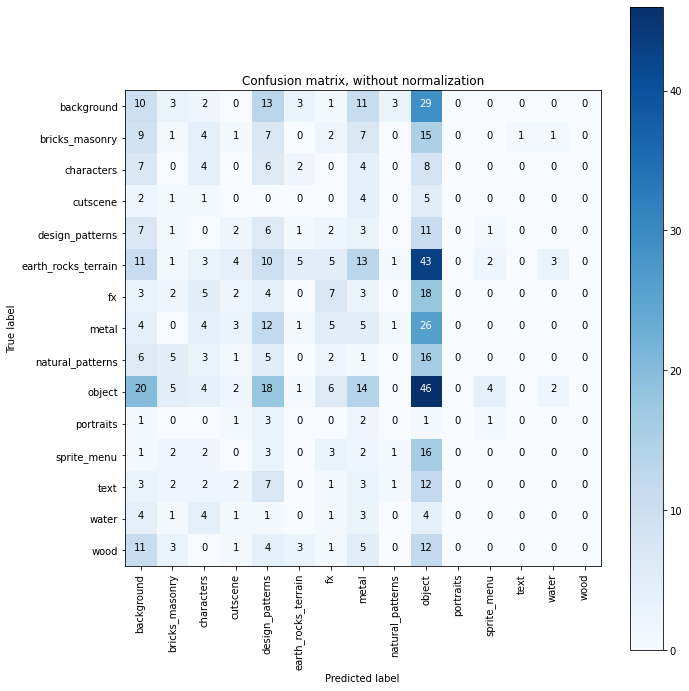

In [141]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list_features,
                      title='Confusion matrix, without normalization')


Normalized confusion matrix
[[13.33333333  4.          2.66666667  0.         17.33333333  4.
   1.33333333 14.66666667  4.         38.66666667  0.          0.
   0.          0.          0.        ]
 [18.75        2.08333333  8.33333333  2.08333333 14.58333333  0.
   4.16666667 14.58333333  0.         31.25        0.          0.
   2.08333333  2.08333333  0.        ]
 [22.58064516  0.         12.90322581  0.         19.35483871  6.4516129
   0.         12.90322581  0.         25.80645161  0.          0.
   0.          0.          0.        ]
 [15.38461538  7.69230769  7.69230769  0.          0.          0.
   0.         30.76923077  0.         38.46153846  0.          0.
   0.          0.          0.        ]
 [20.58823529  2.94117647  0.          5.88235294 17.64705882  2.94117647
   5.88235294  8.82352941  0.         32.35294118  0.          2.94117647
   0.          0.          0.        ]
 [10.89108911  0.99009901  2.97029703  3.96039604  9.9009901   4.95049505
   4.95049505 12.87

<Figure size 432x288 with 0 Axes>

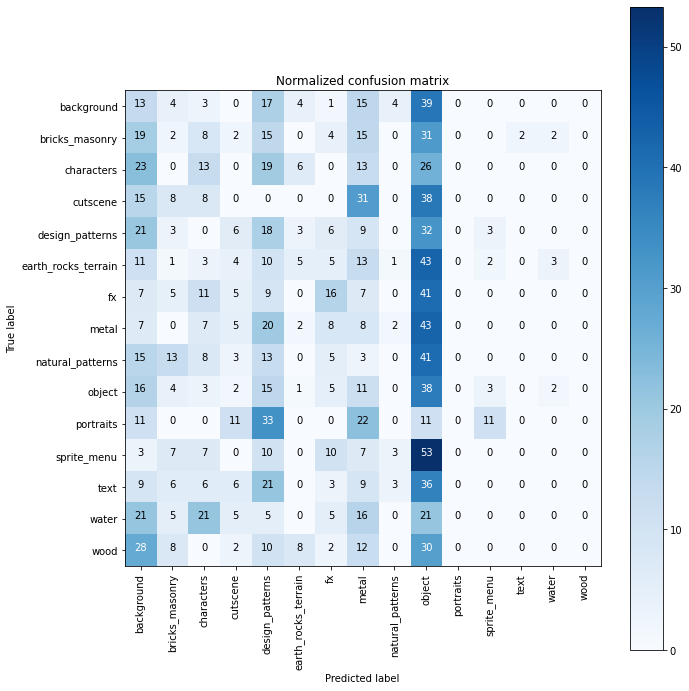

In [142]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list_features, normalize=True,
                      title='Normalized confusion matrix')

Scratch section

Inception Model Work

In [ ]:
inc_checkpoint_dir = 'drive/MyDrive/capstone-2/callbacks/checkpoints/inc'
inc_log_dir = 'drive/MyDrive/capstone-2/callbacks/logs/inc'

In [ ]:
inc_cb_early_stop = tf.keras.callbacks.EarlyStopping(monitor='loss',
                                            patience=5,
                                            verbose=1)

inc_cb_tb_logs = tf.keras.callbacks.TensorBoard(log_dir=inc_log_dir,histogram_freq=1)

inc_cb_model_cp = tf.keras.callbacks.ModelCheckpoint(
                                                monitor='val_accuracy',
                                                filepath=inc_checkpoint_dir,
                                                save_weights_only=True,
                                                save_best_only=True,
                                                save_freq='epoch',
                                                verbose=1)

inc_callbacks = [inc_cb_early_stop,inc_cb_tb_logs,inc_cb_model_cp]

In [ ]:
inc_train_generator,inc_validation_generator,inc_test_generator = img_gen_train(train_dir,validation_dir,test_dir,target_size=(75,75),color_mode='rgb')

Found 3399 images belonging to 15 classes.
Found 592 images belonging to 15 classes.
Found 699 images belonging to 15 classes.


In [ ]:
 from tensorflow.keras.applications.inception_v3 import InceptionV3 

In [ ]:
inc_model = InceptionV3(
    include_top=False, weights='imagenet', input_tensor=None,
    input_shape=(75,75,4), pooling=None, classes=1000,
    classifier_activation='softmax'
)
#inc_model.summary()

ValueError: ignored

In [ ]:
inc_history,inc_predictions = model_compile_fit(inc_model,inc_train_generator,inc_validation_generator,inc_test_generator,resnet_callbacks,n_epoch_steps=80,n_epochs=10,validation_steps=10)


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Epoch 1/10


ValueError: ignored

In [ ]:
y_actual_lst = [(np.argmax(test_generator[i][1], axis = 1)) for i in range(len(test_generator.labels)//test_generator.batch_size + 1)]
y_actual_arr = np.append(np.stack(y_actual_lst[:-1]).flatten(),y_actual_lst[-1])


for i,pred in enumerate(resnet_predictions):
  print([list_features[y_actual_arr[i]],list_features[np.argmax(pred)],pred.max()])

Finding most/least confident predictions for wrong and right predictions

In [120]:
def most_least_conf_imgs(img_generator,predictions,features):
  '''plots most and least confidently predicted images that were correctly and incorrectly predicted'''

  images, labels = next(img_generator)
  preds_list = []

  for batch in range(img_generator.batch_size):
    for j, pic in enumerate(images):
      pred_label = features[list(predictions[j]).index(predictions[j].max())]
      actual_label=features[list(labels[j]).index(1)]
      conf_level=str(predictions[j].max().round(2))
      preds_list.append([pred_label,actual_label,conf_level,pic])

  pred_arr = np.array(preds_list)

  correct_pred = pred_arr[pred_arr[:,0]==pred_arr[:,1]]
  incorrect_pred = pred_arr[pred_arr[:,0]!=pred_arr[:,1]]

  most_conf_corr = correct_pred[np.argsort(correct_pred[:,[3]],axis=1)][-1]
  least_conf_corr = correct_pred[np.argsort(correct_pred[:,[3]],axis=1)][0]

  most_conf_incorr = incorrect_pred[np.argsort(incorrect_pred[:,[3]],axis=1)][-1]
  least_conf_incorr = incorrect_pred[np.argsort(incorrect_pred[:,[3]],axis=1)][0]

  return most_conf_corr,least_conf_corr,most_conf_incorr,least_conf_incorr  

In [126]:
most_conf_corr,least_conf_corr,most_conf_incorr,least_conf_incorr = most_least_conf_imgs(test_generator,resnet_predictions,list_features)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  


In [135]:
#plt.imshow(most_conf_corr[0][3].astype('uint8'))
#plt.imshow(least_conf_incorr[0][3].astype('uint8'))
most_conf_corr[0][:3]

array(['object', 'object', '0.28'], dtype=object)

In [51]:
y_actual_lst = [(np.argmax(test_generator[i][1], axis = 1)) for i in range(len(test_generator.labels)//test_generator.batch_size + 1)]
y_actual_arr = np.append(np.stack(y_actual_lst[:-1]).flatten(),y_actual_lst[-1])
pred_lst = []

for i,pred in enumerate(resnet_predictions):
  pred_lst.append([list_features[y_actual_arr[i]],list_features[np.argmax(pred)],pred.max()])

pred_arr = np.asarray(pred_lst)

correct_pred = pred_arr[pred_arr[:,0]==pred_arr[:,1]]
incorrect_pred = pred_arr[pred_arr[:,0]!=pred_arr[:,1]]



In [69]:
images, labels = next(test_generator)
preds_list = []

for batch in range(test_generator.batch_size):
  for j, pic in enumerate(images):
    pred_label = list_features[list(resnet_predictions[j]).index(resnet_predictions[j].max())]
    actual_label=list_features[list(labels[j]).index(1)]
    conf_level=str(resnet_predictions[j].max().round(2))
    preds_list.append([pred_label,actual_label,conf_level,pic])

pred_arr = np.array(preds_list)

correct_pred = pred_arr[pred_arr[:,0]==pred_arr[:,1]]
incorrect_pred = pred_arr[pred_arr[:,0]!=pred_arr[:,1]]



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  # This is added back by InteractiveShellApp.init_path()


In [104]:
most_conf = correct_pred[np.argsort(correct_pred[:,[3]],axis=1)][-1]

most_conf[0][3]

NameError: ignored

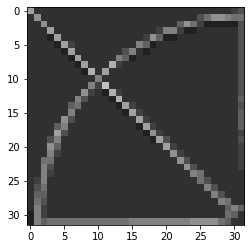

In [103]:
plt.imshow(most_conf[0][3].astype('uint8'))


In [ ]:
def sort_predictions(generator,predictions):
  '''Sorts a group of predictions into two lists: correct and incorrect predictions'''

  correct_preds = predictions[generator.classes == np.argmax(predictions, axis=1)]
  #correct_imgs = generator[generator.classes == np.argmax(predictions, axis=1)]

  incorrect_preds = predictions[generator.classes != np.argmax(predictions, axis=1)]
  #incorrect_imgs = generator[generator.classes != np.argmax(predictions, axis=1)]

  return correct_preds,incorrect_preds

In [ ]:
def find_limits_confidence(labels,predictions):
  '''returns most and least confident predictions per image
  Inputs:
    labels: labels for the images
    predictions: list of predicted images
  Outputs:
    least_confident: array containing the label, confience level and index for the least confident image
    most_confident: array containing the label, confience level and index for the most confident image
  '''
  conf_list = []
  index_list = []

  for i,pred in enumerate(predictions):
    conf_list.append([labels[np.argmax(pred)],pred.max()])
    index_list = [i]

  most_conf = np.array(conf_list)[np.argsort(np.array(conf_list)[:,[1]],axis=0)][-1]
  least_conf = np.array(conf_list)[np.argsort(np.array(conf_list)[:,[1]],axis=0)][0]

  return most_conf,least_conf 


SyntaxError: ignored

In [ ]:
correct_preds,incorrect_preds = sort_predictions(test_generator,resnet_predictions)

In [ ]:
correct_most_conf,correct_least_conf = find_limits_confidence(list_features,correct_preds)
correct_least_conf

array([['earth_rocks_terrain', '0.16848774']], dtype='<U19')

In [ ]:
incorrect_most_conf,incorrect_least_conf = find_limits_confidence(list_features,incorrect_preds)
incorrect_least_conf

array([['background', '0.12125903']], dtype='<U19')

In [ ]:
corr_conf_list = []
imgs_list = []

for i,pred in enumerate(correct_preds):
  corr_conf_list.append([list_features[np.argmax(pred)],pred.max()])
  imgs_list.append()

In [ ]:
most_conf = np.array(corr_conf_list)[np.argsort(np.array(corr_conf_list)[:,[1]],axis=0)][-1]

In [ ]:
most_conf

array([['background', '0.9998745']], dtype='<U19')

In [ ]:
resnet_predictions[0]

array([0.08, 0.02, 0.11, 0.03, 0.09, 0.02, 0.02, 0.07, 0.02, 0.35, 0.06,
       0.09, 0.02, 0.01, 0.  ], dtype=float32)

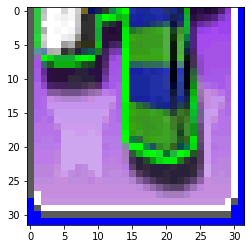

In [ ]:
plt.imshow(next(test_generator)[0][10].astype('uint8'))

Tensorboard

In [143]:
%load_ext tensorboard

In [144]:
%tensorboard --logdir 'drive/MyDrive/capstone-2/callbacks/logs/'

<IPython.core.display.Javascript object>